In [ ]:
#A username/password account for the ICOS authentication service is required for this.
#Obfuscated (not readable by humans) password is stored in a file on the local machine in a default user-specific
#folder. To initialize this file, run the following code interactively 
#(only needs to be done once for every machine):

from icoscp_core.icos import auth
auth.init_config_file()

In [4]:
import icoscp
from icoscp.dobj import Dobj
import sys
sys.path.append("~/.local/lib/python3.10/site-packages/")
#mfrom meteo import air,humidity
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
#import atmos
from datetime import date, datetime, timedelta
import os
import time
import meteo
from pathlib import Path
import datetime as dt
import xarray as xr

plt.rcParams['figure.dpi'] = 500


#Here comes a series of function definitions for handling the forcing creation easily
##########################
def datespan(startDate, endDate, delta=timedelta(days=1)):
    currentDate = startDate
    while currentDate < endDate:
        yield currentDate
        currentDate += delta

def despike(pandas_column, sigma_delta):
   # This function substitutes spikes in data (replaced by nan)
   # The finding criteria for a spike is that contiguous values differ by
   # more than 3*sigma wrt the distribution of series of differences between consecutive
   # values
   delta_z_abs=np.abs(stats.zscore(pandas_column.diff(1),nan_policy='omit'))
   delta_z_abs[0]=0 # Make first value zero instead of nan
   pandas_column_filtered=pandas_column.where(delta_z_abs<sigma_delta, np.nan)
   return pandas_column_filtered

def reduce_pres(pandas_column,station_height):
    #This function reduces pressure in Pa from surface to station height
    #It assumes a pressure gradient of 100 Pa each 9m
    pandas_column_reduced=pandas_column-100*station_height/9
    return pandas_column_reduced

def rh2ah(RH,p,T):
   '''conversion relative humidity to absolute humidity (kg Water per m^3 Air)'''
   mixr=meteo.humidity.rh2mixr(RH, p,T)
   sh=meteo.humidity.mixr2sh(mixr)
   return  sh*meteo.air.rhov(T,p)
####################################################################

#Configuration of the forcing/validation exercise
#################################################################### 
home = str(Path.home()) #Or define here what will be the home path for your SURFEX experiments
station_name='Majadas_south_test' # A directory with this name will be created in 'home'
station_name='Fyodorovskoye_test'
write_forcing_wup='yss'   #Set to yes for writing forcing in files for warm-up period
write_forcing_run='yes'   #Set to yes for writing forcing in files for run period
limcr_inf=0.5        #lower closure rate limit for include SEB data in validation
limcr_sup=1.5    #upper limit for include SEB data in validation
delta_t=1800 # timestep in seconds between observations

Use_Scan='yes' #Evaluate energy storage in the canopy
filter_HLE='yes'  #mDecide if filter some dates with bad quality data from visual inspection (by Meto)
#Define dates to clean by station_name:
datess=[]    
#define periods for warm-up (spin-up) and simulation


#Site/experiment parameters needed for Params_config.txt
#if statement is used below so that one can generate forcings for different stations
#and periods
if station_name=='Majadas_south_test':
 obj_flux='https://meta.icos-cp.eu/objects/dDlpnhS3XKyZjB22MUzP_nAm'
 #ICOSCp object from where to extract forcing variables
 delta_t=1800
 lon=-5.774722
 lat= 39.940556
 alt=258
 height_T=2
 height_V=10
 # 1 month simulations:
 wup_start='2015-9-1 00:00:00'
 wup_end='2016-1-1 00:00:00'
 run_start='2016-1-1 00:00:00'
 run_end='2017-1-1 00:00:00'

if station_name=='Fyodorovskoye_test':
 obj_flux='https://meta.icos-cp.eu/objects/p8vfuGtKaPH90vW6WhKx3q9N'
 #ICOSCp object from where to extract forcing variables
 delta_t=1800
 lon=-5.774722
 lat= 39.940556
 alt=258
 height_T=2
 height_V=10
 # 1 month simulations:
 wup_start='2015-9-1 00:00:00'
 wup_end='2016-1-1 00:00:00'
 run_start='2016-1-1 00:00:00'
 run_end='2017-1-1 00:00:00'


In [5]:
#Load Object containing radiation
#Load Object containing fluxes, eddy covariances etc
dobj_flux=Dobj(obj_flux).data
# Rename 'timestamp' to 'timestamp_start'
dobj_flux2=dobj_flux.rename(columns={'TIMESTAMP': 'TIMESTAMP_START'})

# Create 'average_timestamp' as the midpoint between 'timestamp_start' and 'timestamp_end'
dobj_flux2['TIMESTAMP'] = dobj_flux2['TIMESTAMP_START'] + pd.Timedelta(minutes=30)
dobj_flux2.set_index('TIMESTAMP',inplace=True)
dobj_flux2.shape

#Rename the dataframe
Station_forcing=dobj_flux2

#We get station data from the levels indicated at previous cell
#Info about the forcing variables and format in ascii available here:
#https://www.umr-cnrm.fr/surfex/spip.php?article214

# The example below shows how to process "Fluxnet" type data for "Majadas del Tietar " (Spain)
# or Fyodorovskoye (Rusia) Other Fluxnet data collections can be browsed here: 
# https://data.icos-cp.eu/portal/ (Write "Fluxnet product" in the field "Data type")
# For other types of data from ICOS network (i.e. ecosystem stations, oceanic...) 
# Some more extra work will be needed to adapt this notebook,
# because column names, etc... are not homogeneous

Station_forcing['Forc_LW']=Station_forcing['LW_IN_F']
#New column with SNOW pcp and populate with zero values
Station_forcing['Forc_SNOW']=Station_forcing['P_F']*0
#New column with Forc_CO2 and populate it with constant value.
Station_forcing['Forc_CO2']=0.00062
#Substitute negative SW values for zero values
Station_forcing['Forc_DIR_SW']=np.where(Station_forcing['SW_IN_F'].values<0, 0, Station_forcing['SW_IN_F'])
#New column for scattered/diffuse SW and populate with zero values
Station_forcing['Forc_SCA_SW']=Station_forcing['Forc_DIR_SW']*0
Station_forcing.Forc_SCA_SW.values[:]=0
#Convert Precipitation to precipitation rate
Station_forcing['Forc_RAIN']=Station_forcing['P_F']/delta_t
#Rename other varialbes to suitable forcing file names
Station_forcing.rename(columns={"TA_F":"Forc_TA","PA_F": "Forc_PS","WS_F":"Forc_WIND"},inplace=True)
Station_forcing.rename(columns={"LE_F_MDS":"LE","H_F_MDS": "H"},inplace=True)

#Drop duplicate variables
#Station_forcing=Station_forcing.drop(columns=['P','LW_IN','SW_IN'])
Station_forcing['Forc_PS']=Station_forcing['Forc_PS']*1000 #Convert to Pa
Station_forcing['Forc_DIR']=Station_forcing['Forc_WIND']*0 # For this station there's no wind direction, use 0 values.
Station_forcing['Forc_TA']=Station_forcing['Forc_TA']+273.15 #Convert to Pa
Station_forcing['ESAT']=meteo.humidity.esat(Station_forcing['Forc_TA']) #Saturated vapour pressure in Pa
Station_forcing['E']=Station_forcing['ESAT']-Station_forcing['VPD_F']*100
Station_forcing['Forc_QA']=rh2ah(Station_forcing['E']/Station_forcing['ESAT'],Station_forcing['Forc_PS'],Station_forcing['Forc_TA'])

Forc_CO2 with 0nans
Forc_DIR with 314nans
Forc_PS with 239nans
Forc_RAIN with 265nans
Forc_SNOW with 265nans
Forc_WIND with 314nans
Forc_DIR_SW with 213nans
Forc_LW with 204nans
Forc_QA with 239nans
Forc_SCA_SW with 0nans
Forc_TA with 203nans
Forc_CO2 with 0nans


/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')


Forc_DIR with 462nans
Forc_PS with 122nans
Forc_RAIN with 164nans
Forc_SNOW with 164nans
Forc_WIND with 462nans


/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')


Forc_DIR_SW with 46nans
Forc_LW with 0nans


/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')


Forc_QA with 122nans
Forc_SCA_SW with 0nans
Forc_TA with 0nans


/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:42: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
/tmp/ipykernel_31082/1392778423.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(figsize=(17, 5))
/tmp/ipykernel_31082/1392

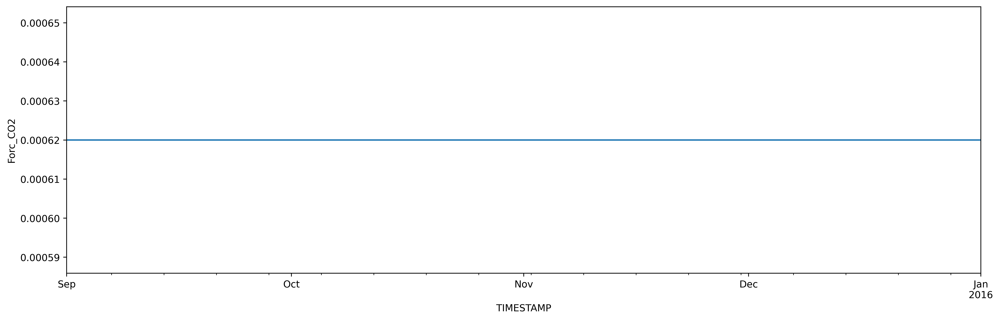

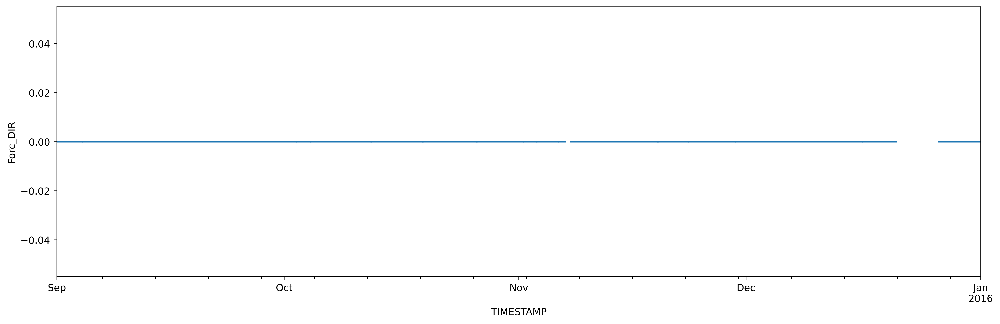

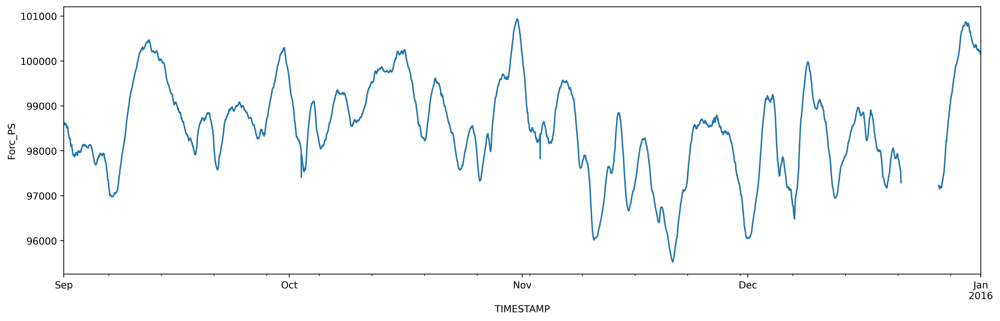

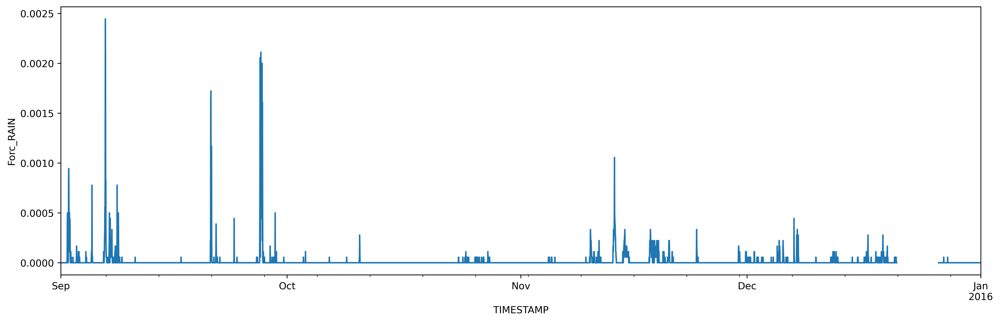

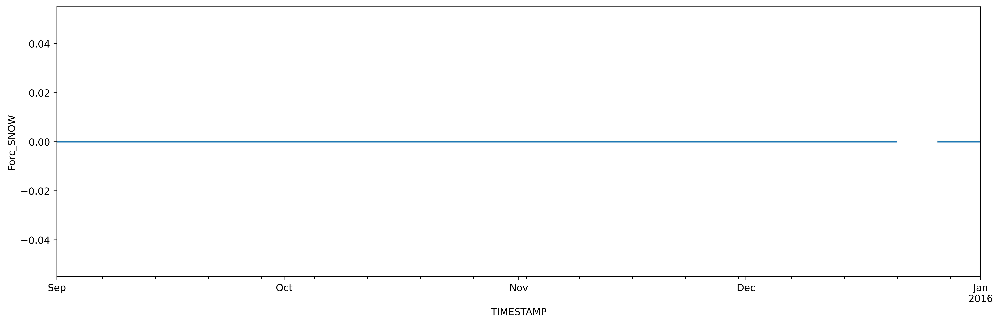

...

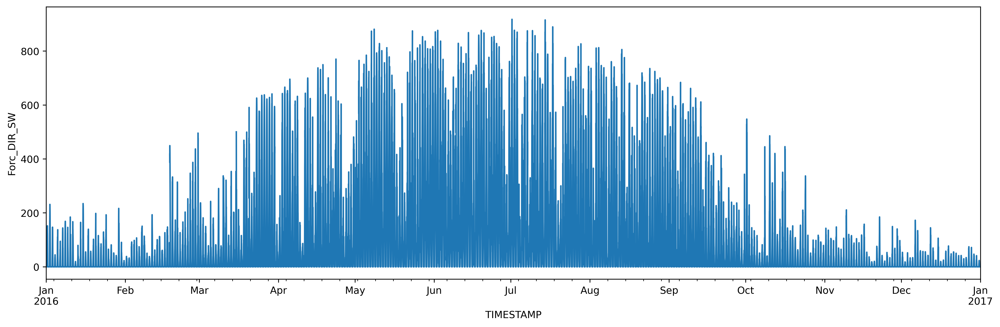

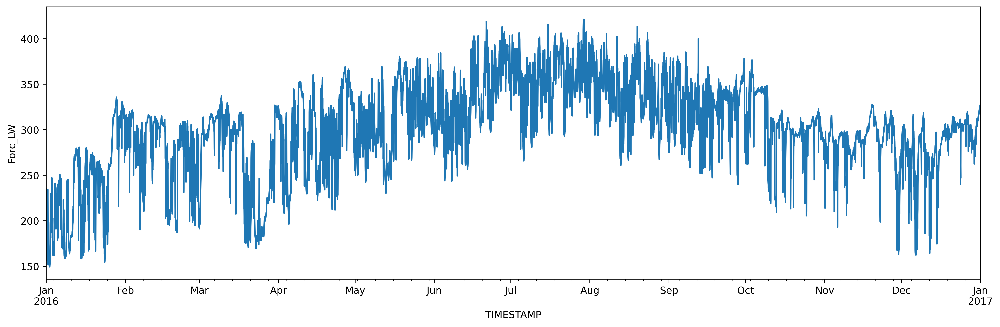

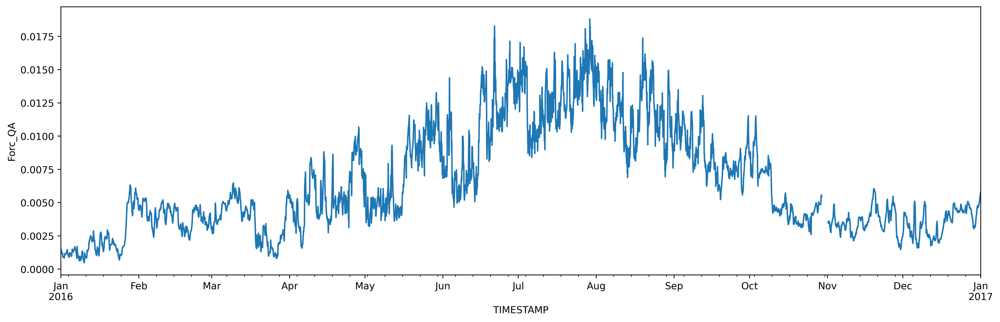

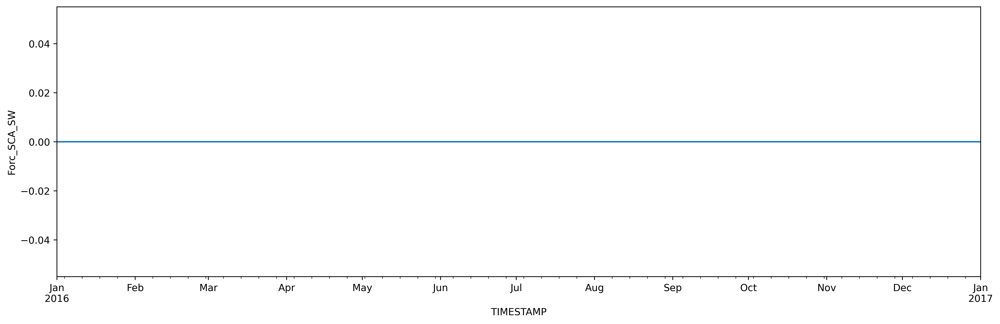

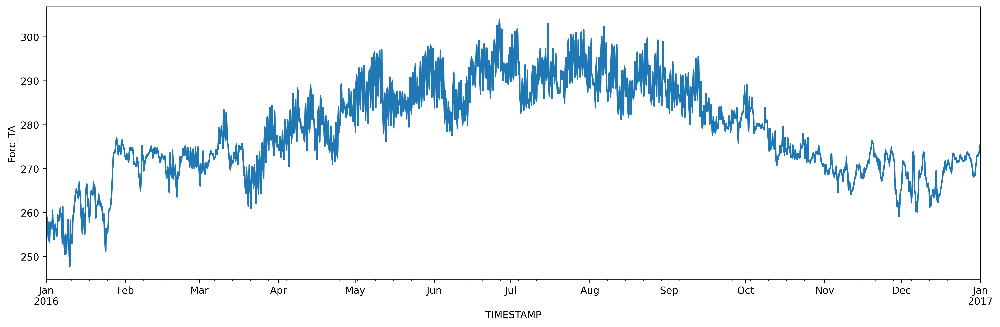

In [6]:
Forcing_vars=['Forc_CO2','Forc_DIR','Forc_PS','Forc_RAIN','Forc_SNOW','Forc_WIND','Forc_DIR_SW','Forc_LW','Forc_QA','Forc_SCA_SW','Forc_TA']

#Select wup data and save it, along with a working Params_config.txt
#Also, plot timeseries of forcing variables for the period (useful for detecting periods w/o data, outliers...)

Station_forcing_wup=Station_forcing.loc[wup_start:wup_end]
Station_forcing_wup.shape
Station_forcing_wup.columns
os.makedirs(home+'/'+station_name+'_run/'+'forcing_wup',exist_ok=True)
os.chdir(home+'/'+station_name+'_run/'+'forcing_wup')

for item in Forcing_vars:
 print(item, 'with '+ str(Station_forcing_wup[item].isna().sum())+ 'nans')
 if write_forcing_wup=='yes':
   np.savetxt(item+'.txt', Station_forcing_wup[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
 fig, axs = plt.subplots(figsize=(17, 5))
 Station_forcing_wup[item].plot(ax=axs,label=item+'no_filter')
 axs.set_ylabel(item) 
#Generate Params_config text file needed by SURFEX for reading forcing for warm-up period:
lines = [1, Station_forcing_wup[item].values.shape[0], delta_t,Station_forcing_wup.index[1].year,
         Station_forcing_wup.index[1].month,Station_forcing_wup.index[1].day,Station_forcing_wup.index[1].hour,
         lon,lat,alt, height_T,height_V]
if write_forcing_wup=='yes':
 with open(home+'/'+station_name+'_run/'+'forcing_wup/Params_config.txt', 'w') as f:
    for line in lines:
        f.write(str(line))
        f.write('\n')
 f.close()

#Select run data and save it, along with a working Params_config.txt
#Also, plot timeseries of forcing variables for the period (useful for detecting periods w/o data, outliers...)

Station_forcing_run=Station_forcing.loc[run_start:run_end]
Station_forcing_run.shape
Station_forcing_run.columns
os.makedirs(home+'/'+station_name+'_run/'+'forcing_run',exist_ok=True)
os.chdir(home+'/'+station_name+'_run/'+'forcing_run')

for item in Forcing_vars:
 print(item, 'with '+ str(Station_forcing_run[item].isna().sum())+ 'nans')
 if write_forcing_run=='yes':
  np.savetxt(item+'.txt', Station_forcing_run[item].fillna(method='bfill').fillna(method='ffill').values, fmt='%.6f')
 fig, axs = plt.subplots(figsize=(17, 5))
 Station_forcing_run[item].plot(ax=axs,label=item+'no_filter')
 axs.set_ylabel(item)    

#Generate Params_config text file needed by SURFEX for reading forcing for run period:

lines = [1, Station_forcing_run[item].values.shape[0], delta_t,Station_forcing_run.index[1].year,
         Station_forcing_run.index[1].month,Station_forcing_run.index[1].day,Station_forcing_run.index[1].hour,
         lon,lat,alt, height_T,height_V]
if write_forcing_run=='yes':
 with open(home+'/'+station_name+'_run/'+'forcing_run/Params_config.txt', 'w') as f:
     for line in lines:
         f.write(str(line))
         f.write('\n')
 f.close()